In [1]:
# Import the FluoPi module
from fluopi import plotting as flup
from fluopi import analysis as flua
# import some useful packages to manage the data

%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import os.path

#modify some matplotlib parameters to manage the images for illustrator
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [2]:
fpath = os.path.abspath('Fotos Norm-N10')
print(fpath)
#imCount = flua.count_files(fpath, 'jpg')
imCount = 1

# save the last image number name
#lim=int(os.listdir(fpath)[-1].split('_')[-1].split('.')[0])
lim = 0

/Users/jorgeriverosvergara/Desktop/Universidad/10ºSemestre/Biologia Sintetica y Prototipado de Funciones Artificiales/Proyecto/biosync/Fotos Norm-N10


In [3]:
import os
fname = os.path.join(fpath, 'LBkan_30uL_TLT2_10-11-17-14%02d.jpg')

Frames = 1
#Frames=12   # use one image every 12 frames, uncomment if you use the original data

DataS={}
DataS['R'],DataS['G'],DataS['B'] = flua.get_im_data(Frames,imCount,fname)
DataS['Im']=fname     # to store the related image source
print(fname)

# also define a vector with the channels
channels=['R','G','B']

/Users/jorgeriverosvergara/Desktop/Universidad/10ºSemestre/Biologia Sintetica y Prototipado de Funciones Artificiales/Proyecto/biosync/Fotos Norm-N10/LBkan_30uL_TLT2_10-11-17-14%02d.jpg


[ 0.]


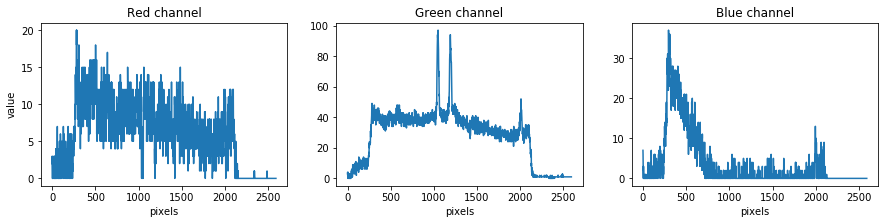

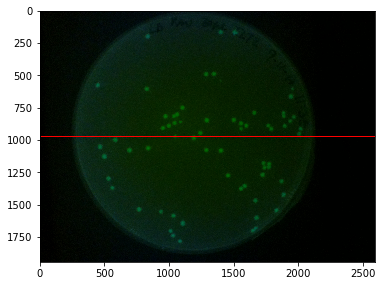

In [4]:
#define it in hour units
dT=1.0  # hours, in this example interval = 1 hour for each frame
w,h,st=DataS['R'].shape
T=np.zeros((st))
for i in range(0,st):
    T[i]=(i)*Frames*dT

print(T)
flup.row_transect(DataS, row=int(w/2), x_frames=Frames)

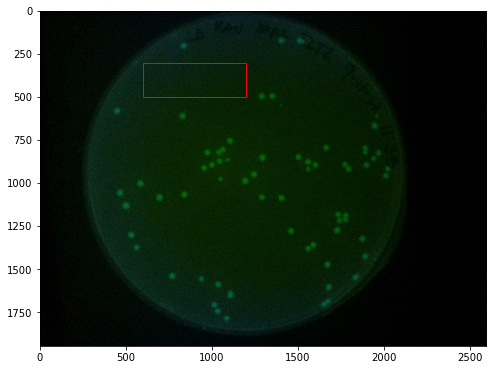

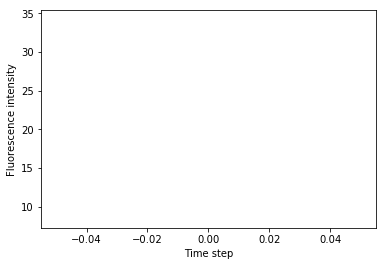

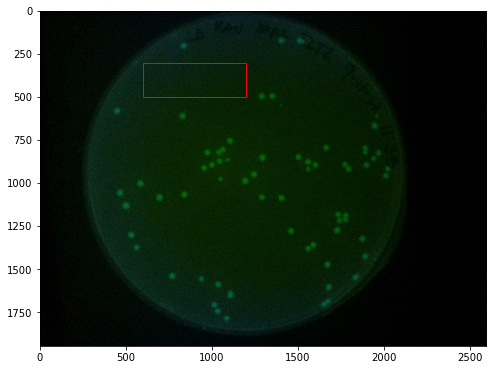

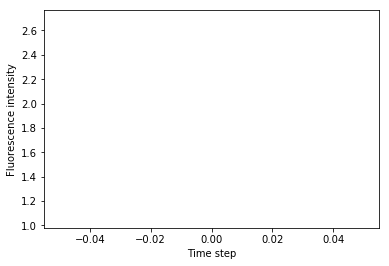

In [5]:
BG = flua.bg_value(300, 500, 600, 1200, DataS, imCount)
DataSB = flua.bg_subst(DataS,BG)
_ = flua.bg_value(300, 500, 600, 1200, DataSB, imCount)

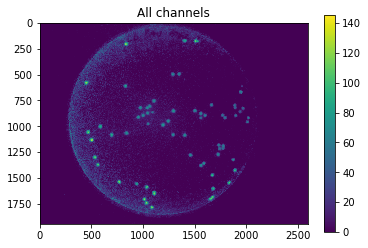

In [6]:
SumData = flua.data_sum_time(DataSB)

(1944, 2592, 3)


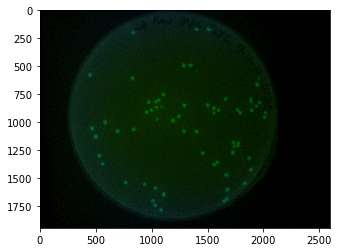

In [7]:
from skimage.filters import gaussian

#Obtenido de Analisis_Correlations
filename = "/Users/jorgeriverosvergara/Desktop/Universidad/10ºSemestre/Biologia Sintetica y Prototipado de Funciones Artificiales/Proyecto/biosync/Fotos Norm-N10/LBkan_30uL_TLT2_10-11-17-1400.jpg"
imagefile = plt.imread(filename)
print(imagefile.shape)
plt.imshow(imagefile, aspect='equal')

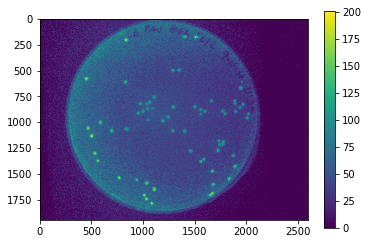

In [8]:
image_sum = imagefile.sum(axis=2)
plt.imshow(image_sum)
plt.colorbar()

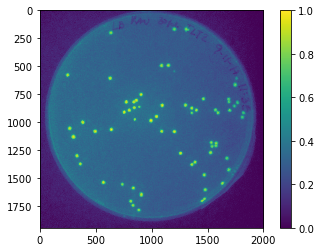

In [9]:
g_image = gaussian(imagefile[:, 200:2200, 1], 1)
ng_image = (g_image-g_image.min())/(g_image.max()-g_image.min())

plt.imshow(ng_image)
plt.colorbar()

In [10]:
import skimage.feature as skfeat
BLB = skfeat.blob_log(ng_image, min_sigma=5.0, max_sigma=75.0, num_sigma=15, threshold=0.16, overlap=0.8)

print(BLB.shape)
print(BLB[0:5, :])

(62, 3)
[[ 1782.   882.    10.]
 [ 1741.   830.    10.]
 [ 1703.   810.    10.]
 [ 1697.  1454.    15.]
 [ 1683.  1468.    10.]]


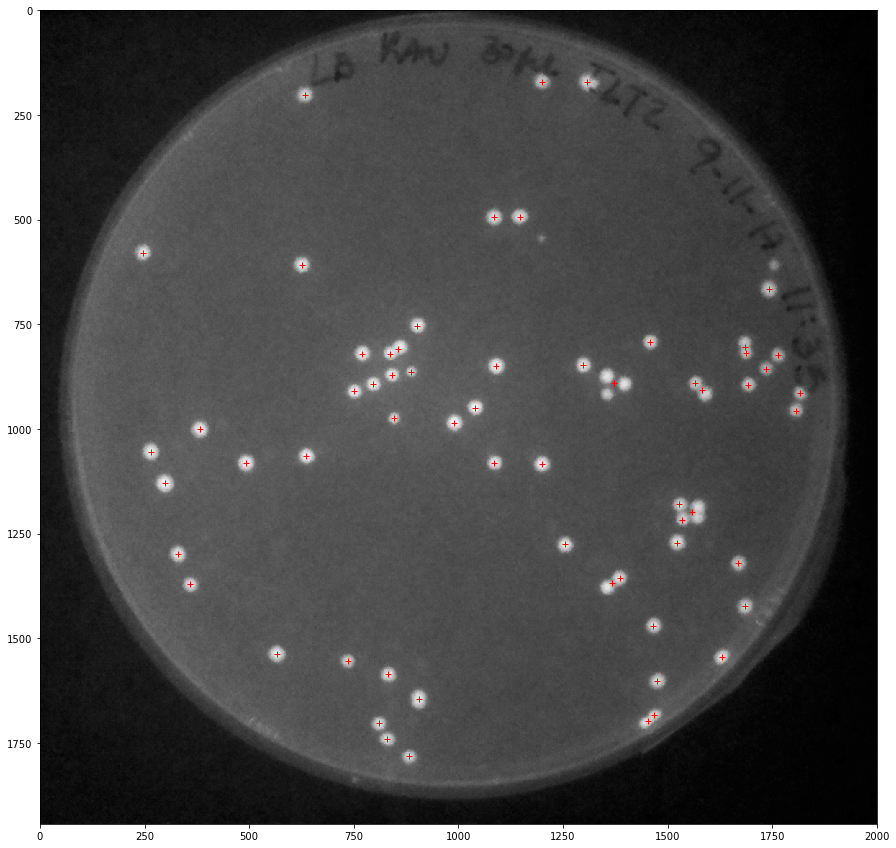

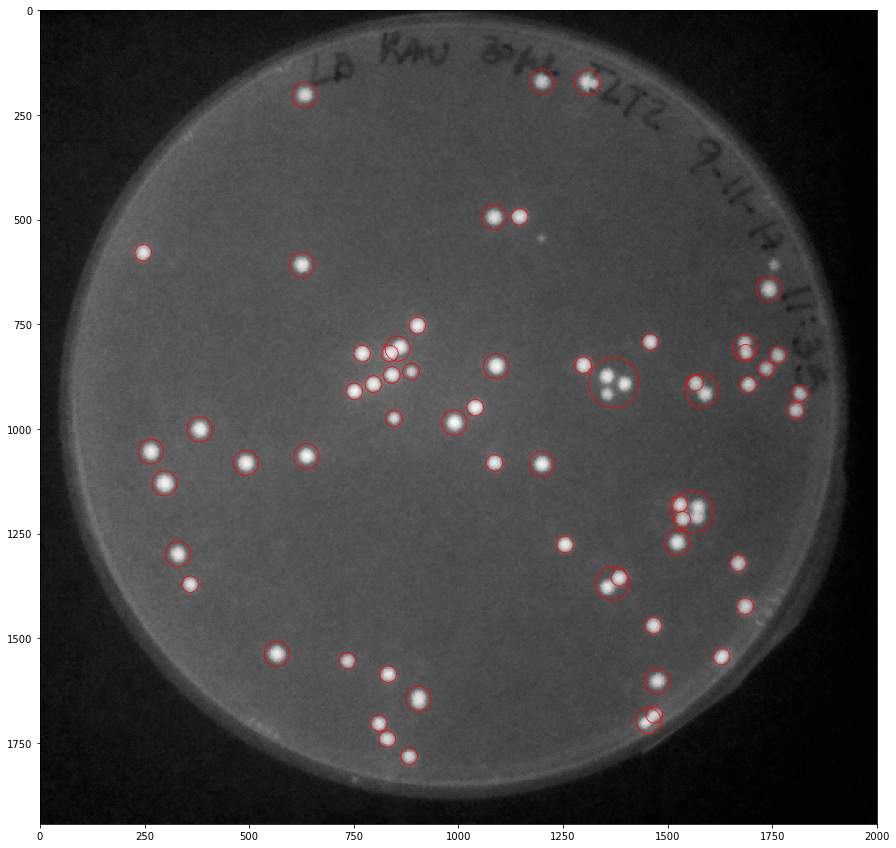

In [11]:
plt.figure(figsize=(15, 15))
plt.imshow(ng_image, cmap='gray')
#plt.hold(True)
for i in range(len(BLB)):
    plt.plot(BLB[i, 1], BLB[i, 0], 'r+')

plt.figure(figsize=(15, 15))
plt.imshow(ng_image, cmap='gray')
#plt.hold(True)
for i in range(len(BLB)):
    circle = plt.Circle((BLB[i, 1], BLB[i, 0]), 2*BLB[i, 2], color='r', fill=False, lw=0.8)
    fig = plt.gcf()
    ax = fig.gca()
    ax.add_artist(circle)

In [12]:
print(BLB[12])

[ 1424.  1685.    10.]


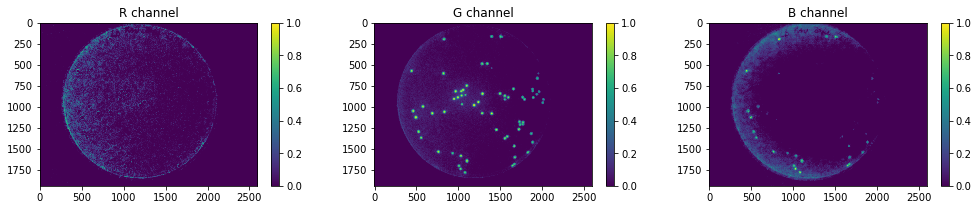

In [13]:
sDatS,sDatSall,sDatST=flua.smooth_data(DataSB,sigma=1)

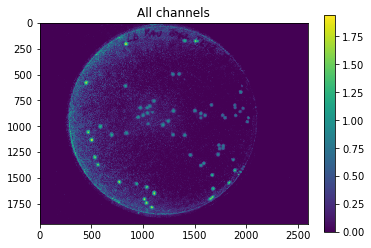

In [14]:
plt.imshow(sDatSall)
plt.colorbar()
plt.title('All channels')

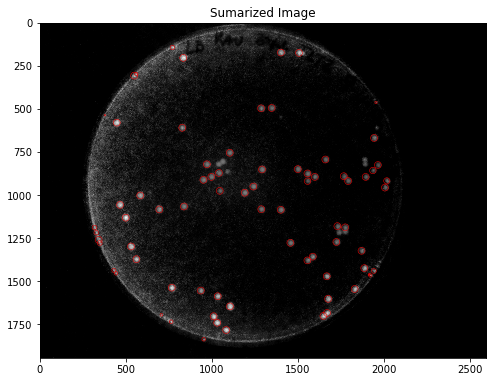

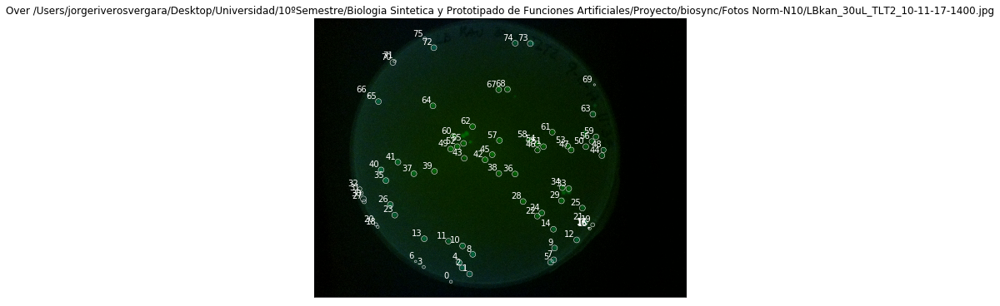

In [15]:
#0.26
blobD = flua.colony_blobs_id(sDatSall,0.34,fname%(lim),filename='DetectedBlobs')

/Users/jorgeriverosvergara/anaconda/envs/fluopi/lib/python3.6/site-packages/matplotlib/pyplot.py:3315: MatplotlibDeprecationWarning: The 'hold' keyword argument is deprecated since 2.0.
  mplDeprecation)
/Users/jorgeriverosvergara/anaconda/envs/fluopi/lib/python3.6/site-packages/matplotlib/pyplot.py:3150: MatplotlibDeprecationWarning: The 'hold' keyword argument is deprecated since 2.0.
  mplDeprecation)


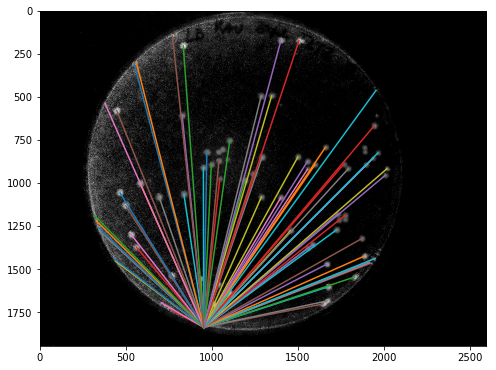

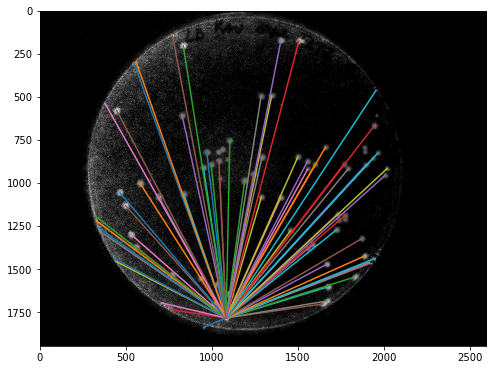

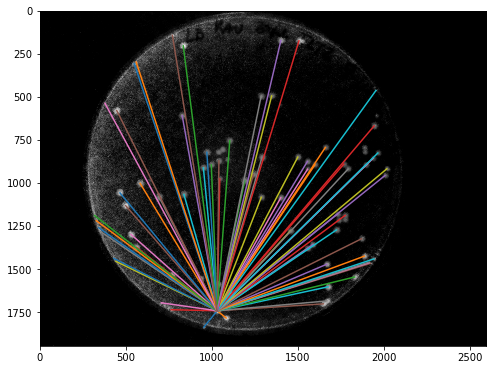

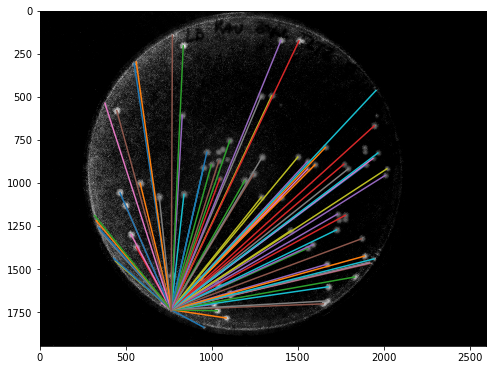

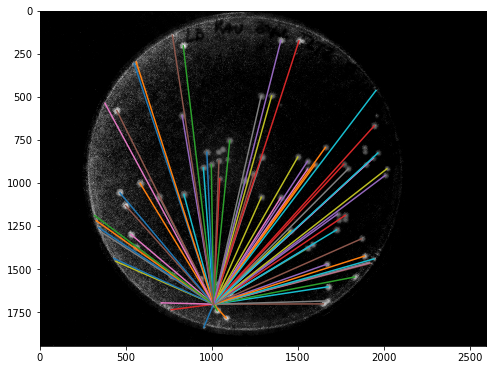

...

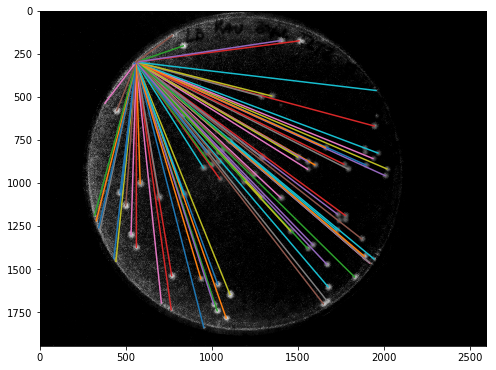

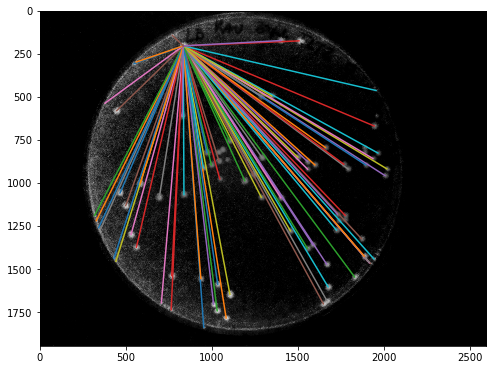

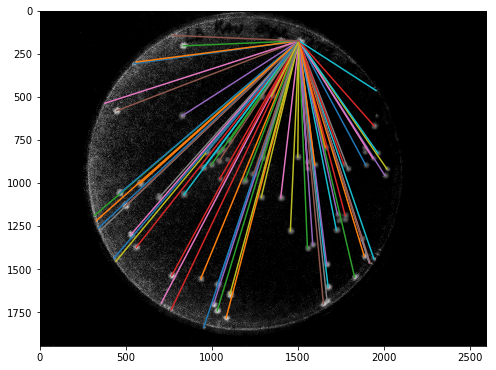

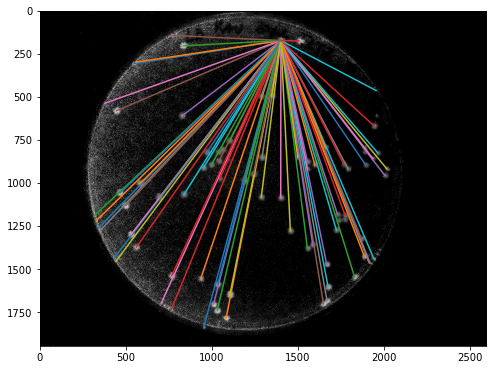

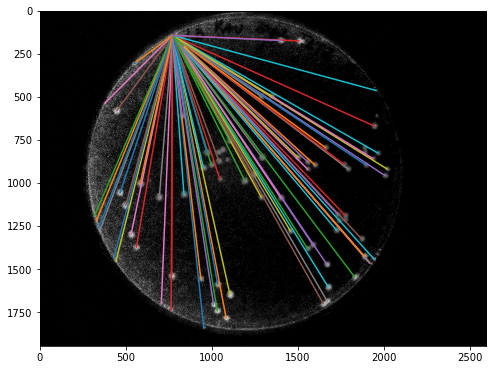

[1704.743089148626, 1670.3966594794183, 1620.0003086419458, 1593.0153797123241, 1579.1902988557142, 1788.7453703643791, 1554.3181784949952, 1784.4237164978501, 1540.6401267005867, 1717.211693414647, 1468.7389148517855, 1421.6078924935666, 1757.2060209320932, 1395.0057347552374, 1602.8278135844785, 1753.0479172002117, 1746.095358220736, 1743.1732558756173, 1352.3786452025927, 1747.4850500075815, 1338.8894651912083, 1698.3874705143112, 1464.5221063541512, 1247.6301535310854, 1463.0276825815704, 1612.5647273830591, 1180.650668064013, 1211.8498256797334, 1325.6885003649991, 1477.5669189583259, 1196.1910382543417, 1163.2454599094724, 1139.4823386081946, 1448.4591813371892, 1412.5183184652863, 1025.4569713059636, 1133.5298849170233, 944.06408680767004, 1072.3133870282511, 926.42592796186352, 964.17892530380482, 880.09601748900104, 942.72795651767956, 877.21947082813892, 1478.2936108906106, 934.75344342773087, 1104.5152783008482, 1281.6302118786059, 1466.5094612719006, 789.78541389417921, 135

In [16]:
def distanceBLOB(blobs,central): #inserta blobD e indice de el blob a investigar (lo ultimo le da flexibilidad para el futuro)
    distcenter = np.sqrt(((blobs[0]-central[0])**2)+((blobs[1]-central[1])**2))
    plt.plot([central[1],blobs[1]],[central[0],blobs[0]])
    return distcenter

for c in range(0, len(blobD)):
    distcen = []
    plt.figure(figsize=(8,8))
    for element in blobD:
        distcen.append(distanceBLOB(element,blobD[c])) #2 por ejemplo
    plt.imshow(sDatSall, cmap='gray')
    plt.show()

print(distcen)

In [17]:
Rois,RoisC,NC = flua.obtain_rois(sDatST,blobD)

ROI x1 x2 y1 y2
0 1825 1848 941 964
ROI x1 x2 y1 y2
1 1762 1803 1062 1103
ROI x1 x2 y1 y2
2 1720 1761 1010 1051
ROI x1 x2 y1 y2
3 1723 1746 752 775
ROI x1 x2 y1 y2
4 1682 1723 989 1030
ROI x1 x2 y1 y2
5 1680 1721 1627 1668
ROI x1 x2 y1 y2
6 1686 1703 698 715
ROI x1 x2 y1 y2
7 1663 1704 1648 1689
ROI x1 x2 y1 y2
8 1625 1666 1084 1125
ROI x1 x2 y1 y2
9 1581 1622 1654 1695
ROI x1 x2 y1 y2
10 1566 1607 1013 1054
ROI x1 x2 y1 y2
11 1533 1574 915 956
ROI x1 x2 y1 y2
12 1524 1565 1808 1849
ROI x1 x2 y1 y2
13 1516 1557 746 787
ROI x1 x2 y1 y2
14 1450 1491 1646 1687
ROI x1 x2 y1 y2
15 1455 1476 1909 1930
ROI x1 x2 y1 y2
16 1455 1468 1907 1920
ROI x1 x2 y1 y2
17 1455 1462 1909 1916
ROI x1 x2 y1 y2
18 1443 1464 432 453
ROI x1 x2 y1 y2
19 1425 1454 1926 1955
ROI x1 x2 y1 y2
20 1424 1449 418 443
ROI x1 x2 y1 y2
21 1403 1444 1864 1905
ROI x1 x2 y1 y2
22 1358 1399 1534 1575
ROI x1 x2 y1 y2
23 1351 1392 541 582
ROI x1 x2 y1 y2
24 1336 1377 1565 1606
ROI x1 x2 y1 y2
25 1302 1343 1848 1889
ROI x1 x2 y1 

ROI x1 x2 y1 y2
71 286 307 550 571
ROI x1 x2 y1 y2
72 182 223 813 854
ROI x1 x2 y1 y2
73 153 194 1485 1526
ROI x1 x2 y1 y2
74 151 192 1380 1421
ROI x1 x2 y1 y2
75 128 155 757 784


In [19]:
def distanceBLOB(blobs,central): #inserta blobD e indice de el blob a investigar (lo ultimo le da flexibilidad para el futuro)
    distcenter = np.sqrt(((blobs[0]-central[0])**2)+((blobs[1]-central[1])**2))
    plt.plot([central[1],blobs[1]],[central[0],blobs[0]],hold = True)
    return distcenter

#IMPORTANTE, ESTE CODIGO NO CONSIDERARA CADA UNA DE NUESTRAS IMAGENES COMO DISTINTAS, NUESTRO RADIO ES DISTINTO PARA
#CADA IMAGEN, NUESTRAS DISTANCIAS SON "DISTINTAS" PARA CADA IMAGEN Y ESO ES LO QUE CORRELACIONAMOS PARA CADA INTENTO
#DEL EXPERIMENTO, POR LO CUAL FLUOPI, QUE USA TIMELAPSES, PARA --LAS MISMAS PLACAS-- NO NOS SIRVE.

distcen = []
radius = r_fit
plt.figure(figsize=(8,8))
i = 0

for element in blobD:
    i += 1
    central = 12 #por ejemplo
    distances = distanceBLOB(element,blobD[central])
    distrad.append([distances,radius[i], radius[central],len(blobD)]) #distrad es [distancia,radiosatelite,radiocentral,numerodeblobs] 
    avdist += distances/len(blobD)
    avrad +=radius[central]/len(blodD)
    
'''
for element in distrad:
    xi,xp = element[2],avdrad
    yi,yp = element[0],avdist
    aux1 += (xi-xp)*(yi-yp)
    aux2 +=
    aux3 += (xi-xp)*(yi-yp),np.sqrt((xi-xp)**2)),np.sqrt((yi-yp)**2)
    
correlation = aux1/(aux2*aux3)
'''
#aca tenemos una correlacion para 1 n, luego lo hacemos para multiples n y graficamos n versus correlacion, encon-
#trando como varia el crecimiento de las baterias dependiendo del numero de bacterias satelites
#Ademas si la curva es bonita, podemos modelarle una curva y asi predecir para cualquier n y aplicarlo a cualquier
#muestra y cualquier colonia centrar.

plt.imshow(sDatSall, cmap='gray',hold = True)
plt.show()
print(distcen)

NameError: name 'r_fit' is not defined

In [ ]:
import os
fname = os.path.join(fpath, 'LBkan_30uL_TLT2_10-11-17-14%02d.jpg')

Frames = 1
#Frames=12   # use one image every 12 frames, uncomment if you use the original data

DataS={}
DataS['R'],DataS['G'],DataS['B'] = flua.get_im_data(Frames,imCount,fname)
DataS['Im']=fname     # to store the related image source
print(fname)

# also define a vector with the channels
channels=['R','G','B']

In [ ]:
#DataSB ng_image
DataSB = flua.bg_subst(DataS,BG)

In [ ]:
sDatS,sDatSall,sDatST=flua.smooth_data(DataSB,sigma=1)

In [ ]:
Rois,RoisC,NC = flua.obtain_rois(sDatST,A)

In [ ]:
#define the selected colonies
Cols=[8, 10, 11, 13]

ACRoisS=flua.channels_sum(Rois,Cols) #square ROIS

In [ ]:
import time
start = time.time()
R_frame=flua.frame_colony_radius(ACRoisS,Cols,0.37)
end = time.time()
print(str(end - start)+' seg') #to know how long it takes to run

In [ ]:
A=flua.area(R_frame,Cols,T)

In [ ]:
idx=Cols[2:3] # idx have to be an array, then to select one colony use this notation Cols[desired:desired+1]
init=20
end=-1
SingleF=flua.function_fit(T,A,init,end,idx)

In [ ]:
init=21
end=-1
A_fitS=flua.function_fit(T,A,init,end,Cols)

In [ ]:
from math import pi
r_fit={}

plt.figure()
for i, c in zip(Cols, colors):
    r_fit[i]=(A_fitS[i][0]/pi)**(0.5)
    
    plt.plot(T,r_fit[i],'-',color=c,label='colony '+str(i))

plt.title('fitted radius')
plt.ylabel('radius [pixels]')
plt.xlabel('time [h]')
plt.legend(loc='upper left')
plt.savefig("Plots/Size_and_fluo/colonyRadiusFit.pdf", transparent=True)